## 1. Importing the modules

In [138]:
pip install missingno

Note: you may need to restart the kernel to use updated packages.


In [139]:
!pip install imblearn

In [140]:
pip install -U imbalanced-learn

Note: you may need to restart the kernel to use updated packages.


In [141]:
pip install xgboost

Note: you may need to restart the kernel to use updated packages.


In [142]:
pip install -U scikit-learn

Note: you may need to restart the kernel to use updated packages.


In [143]:
pip show imbalanced-learn

Name: imbalanced-learnNote: you may need to restart the kernel to use updated packages.

Version: 0.9.1
Summary: Toolbox for imbalanced dataset in machine learning.
Home-page: https://github.com/scikit-learn-contrib/imbalanced-learn
Author: 
Author-email: 
License: MIT
Location: c:\users\200367\anaconda3\lib\site-packages
Requires: threadpoolctl, scikit-learn, scipy, numpy, joblib
Required-by: imblearn


In [144]:
import sklearn.metrics
from sklearn.metrics import precision_score, recall_score, confusion_matrix, classification_report, accuracy_score, f1_score
import numpy as np 
import pandas as pd 
import os
import missingno as msno
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from scipy import stats
from sklearn.linear_model import LogisticRegression
from imblearn.over_sampling import SMOTE
from collections import Counter
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, f1_score
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.naive_bayes import BernoulliNB
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestRegressor
import warnings

warnings.filterwarnings("ignore")

## 1.1 Reading the dataset

In [145]:
rain = pd.read_csv(r'C:\Users\200367\Desktop\DataScienceBootCamp\weatherAUS.csv')
rain.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


The dataset contains 23 attributes:
About some of them are
DATE - The date of observation
LOCATION - The common name of the location of the weather station
MINTEMP - The minimum temperature in degrees celsius

MAXTEMP - The maximum temperature in degrees celsius

RAINFALL - The amount of rainfall recorded for the day in mm

EVAPORATION - The so-called Class A pan evaporation (mm) in the 24 hours to 9am

SUNSHINE - The number of hours of bright sunshine in the day.

WINDGUESTDIR - The direction of the strongest wind gust in the 24 hours to midnight

WINDGUESTSPEED- The speed (km/h) of the strongest wind gust in the 24 hours to midnight

WINDDIR9AM - Direction of the wind at 9am

## 1.2 Shape of DataFrame

In [146]:
print(f'The number of rows are {rain.shape[0] } and the number of columns are {rain.shape[1]}')

The number of rows are 145460 and the number of columns are 23


## 1.3 Describing the attributes

In [147]:
rain.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

#### 6 columns are of type 'object' and remaining of 'float'

## 1.4 Finding all the categorical and continuous values

In [148]:
categorical_col, contin_val=[],[]

for i in rain.columns:
    
    if rain[i].dtype == 'object':
        categorical_col.append(i)
    else:
        contin_val.append(i)
        
print(categorical_col)
print(contin_val)

['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']
['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']


## 1.5 Unique values

In [149]:
rain.nunique()

Date             3436
Location           49
MinTemp           389
MaxTemp           505
Rainfall          681
Evaporation       358
Sunshine          145
WindGustDir        16
WindGustSpeed      67
WindDir9am         16
WindDir3pm         16
WindSpeed9am       43
WindSpeed3pm       44
Humidity9am       101
Humidity3pm       101
Pressure9am       546
Pressure3pm       549
Cloud9am           10
Cloud3pm           10
Temp9am           441
Temp3pm           502
RainToday           2
RainTomorrow        2
dtype: int64

## 1.6 Checking Null values

In [150]:
rain.isnull().sum()

Date                 0
Location             0
MinTemp           1485
MaxTemp           1261
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustDir      10326
WindGustSpeed    10263
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
RainToday         3261
RainTomorrow      3267
dtype: int64

## 1.7 Visualizing the missing values

<AxesSubplot:>

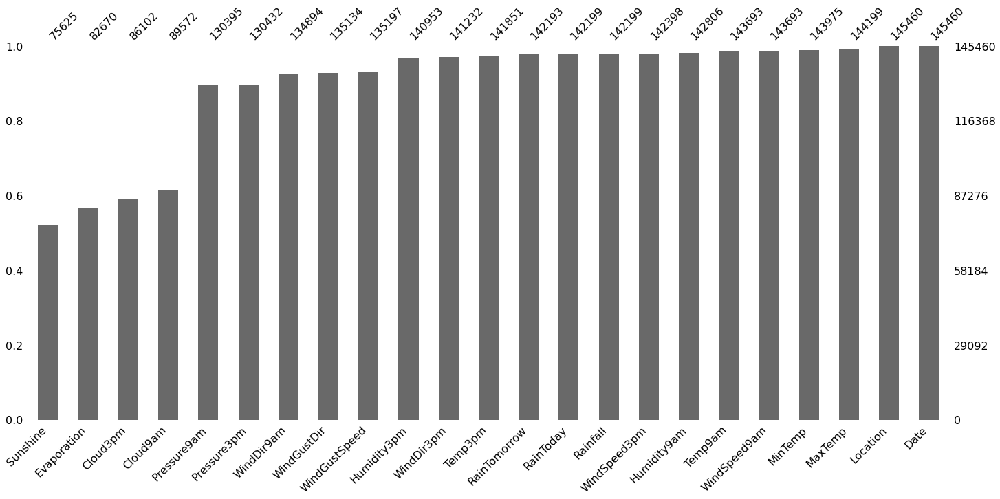

In [151]:
msno.bar(rain, sort='ascending')

<AxesSubplot:>

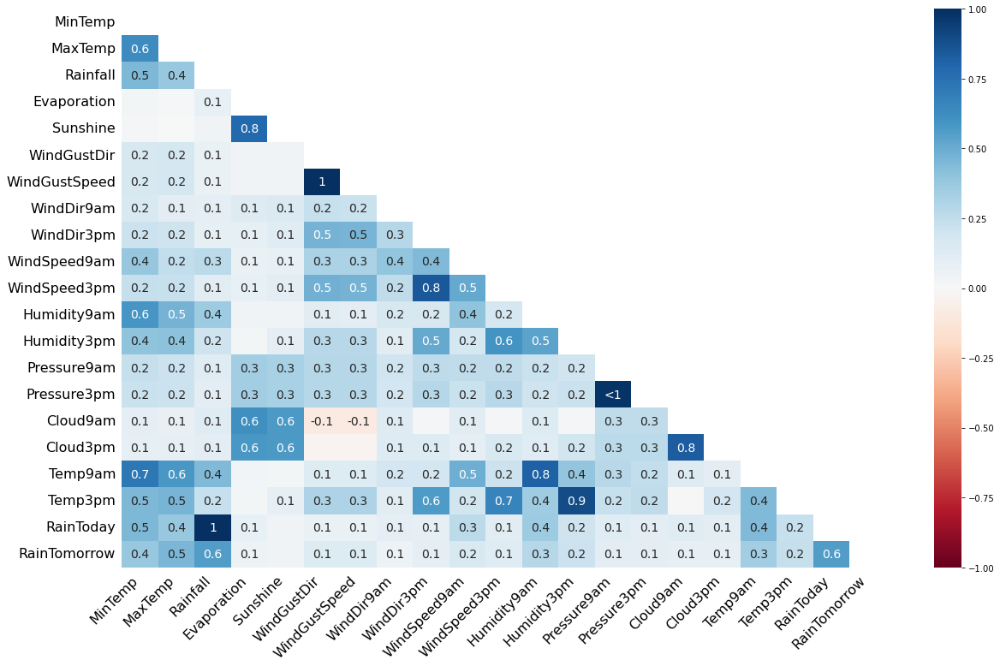

In [152]:
msno.heatmap(rain)

#### The above graphs show that the number of missing values are high in: Sunshine, Evaporation, Cloud3pm and Cloud9am.

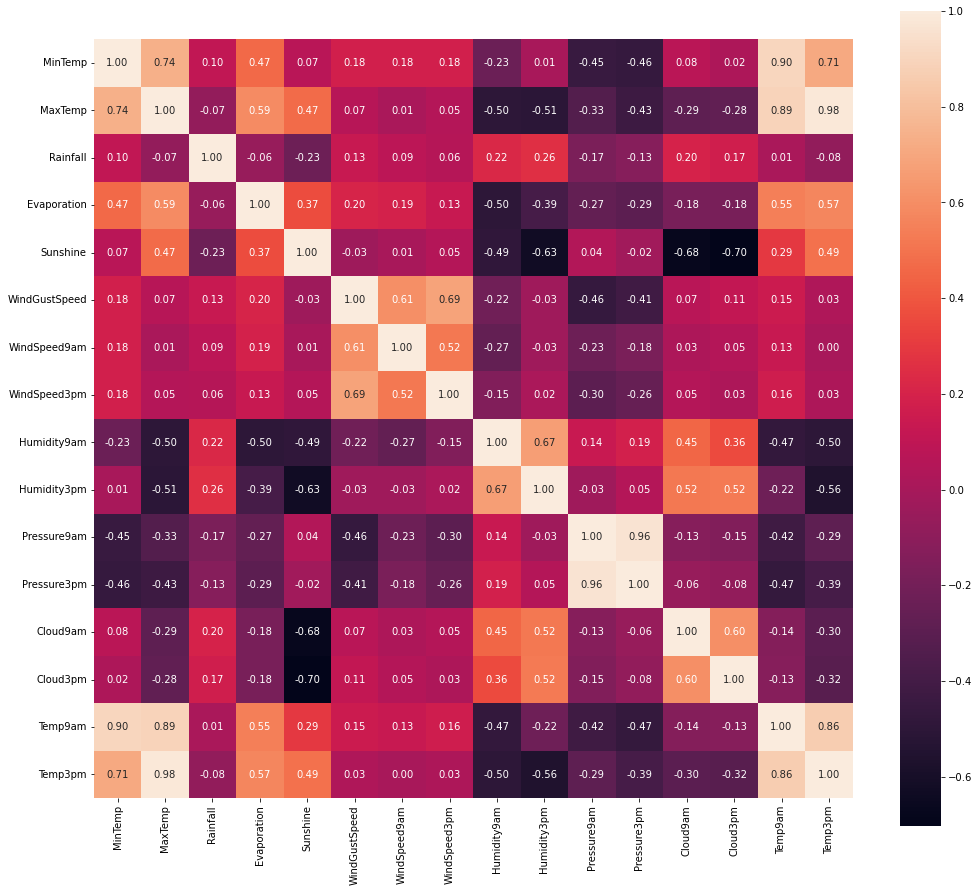

In [153]:
plt.figure(figsize=(17,15))
ax = sns.heatmap(rain.corr(), square=True, annot=True, fmt='.2f')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)          
plt.show()

## 1.8 Changing yes and no to 1 and 0 in some columns

In [154]:
rain['RainTomorrow'] = rain['RainTomorrow'].map({'Yes': 1, 'No': 0})
rain['RainToday'] = rain['RainToday'].map({'Yes': 1, 'No': 0})

print(rain.RainToday)
print(rain.RainTomorrow)

0         0.0
1         0.0
2         0.0
3         0.0
4         0.0
         ... 
145455    0.0
145456    0.0
145457    0.0
145458    0.0
145459    0.0
Name: RainToday, Length: 145460, dtype: float64
0         0.0
1         0.0
2         0.0
3         0.0
4         0.0
         ... 
145455    0.0
145456    0.0
145457    0.0
145458    0.0
145459    NaN
Name: RainTomorrow, Length: 145460, dtype: float64


## 1.9 Dealing with the missing values

In [155]:
#Checking percentage of missing data in every column

(rain.isnull().sum()/len(rain))*100

Date              0.000000
Location          0.000000
MinTemp           1.020899
MaxTemp           0.866905
Rainfall          2.241853
Evaporation      43.166506
Sunshine         48.009762
WindGustDir       7.098859
WindGustSpeed     7.055548
WindDir9am        7.263853
WindDir3pm        2.906641
WindSpeed9am      1.214767
WindSpeed3pm      2.105046
Humidity9am       1.824557
Humidity3pm       3.098446
Pressure9am      10.356799
Pressure3pm      10.331363
Cloud9am         38.421559
Cloud3pm         40.807095
Temp9am           1.214767
Temp3pm           2.481094
RainToday         2.241853
RainTomorrow      2.245978
dtype: float64

In [156]:
#Filling the missing values for continuous variables with mean
rain['MinTemp']=rain['MinTemp'].fillna(rain['MinTemp'].mean())
rain['MaxTemp']=rain['MaxTemp'].fillna(rain['MaxTemp'].mean())
rain['Rainfall']=rain['Rainfall'].fillna(rain['Rainfall'].mean())
rain['Evaporation']=rain['Evaporation'].fillna(rain['Evaporation'].mean())
rain['Sunshine']=rain['Sunshine'].fillna(rain['Sunshine'].mean())
rain['WindGustSpeed']=rain['WindGustSpeed'].fillna(rain['WindGustSpeed'].mean())
rain['WindSpeed9am']=rain['WindSpeed9am'].fillna(rain['WindSpeed9am'].mean())
rain['WindSpeed3pm']=rain['WindSpeed3pm'].fillna(rain['WindSpeed3pm'].mean())
rain['Humidity9am']=rain['Humidity9am'].fillna(rain['Humidity9am'].mean())
rain['Humidity3pm']=rain['Humidity3pm'].fillna(rain['Humidity3pm'].mean())
rain['Pressure9am']=rain['Pressure9am'].fillna(rain['Pressure9am'].mean())
rain['Pressure3pm']=rain['Pressure3pm'].fillna(rain['Pressure3pm'].mean())
rain['Cloud9am']=rain['Cloud9am'].fillna(rain['Cloud9am'].mean())
rain['Cloud3pm']=rain['Cloud3pm'].fillna(rain['Cloud3pm'].mean())
rain['Temp9am']=rain['Temp9am'].fillna(rain['Temp9am'].mean())
rain['Temp3pm']=rain['Temp3pm'].fillna(rain['Temp3pm'].mean())

In [157]:
#Filling the missing values for continuous variables with mode

rain['RainToday']=rain['RainToday'].fillna(rain['RainToday'].mode()[0])
rain['RainTomorrow']=rain['RainTomorrow'].fillna(rain['RainTomorrow'].mode()[0])

In [158]:
#Filling the missing values for continuous variables with mode
rain['WindDir9am'] = rain['WindDir9am'].fillna(rain['WindDir9am'].mode()[0])
rain['WindGustDir'] = rain['WindGustDir'].fillna(rain['WindGustDir'].mode()[0])
rain['WindDir3pm'] = rain['WindDir3pm'].fillna(rain['WindDir3pm'].mode()[0])

In [159]:
#Checking percentage of missing data in every column

(rain.isnull().sum()/len(rain))*100

Date             0.0
Location         0.0
MinTemp          0.0
MaxTemp          0.0
Rainfall         0.0
Evaporation      0.0
Sunshine         0.0
WindGustDir      0.0
WindGustSpeed    0.0
WindDir9am       0.0
WindDir3pm       0.0
WindSpeed9am     0.0
WindSpeed3pm     0.0
Humidity9am      0.0
Humidity3pm      0.0
Pressure9am      0.0
Pressure3pm      0.0
Cloud9am         0.0
Cloud3pm         0.0
Temp9am          0.0
Temp3pm          0.0
RainToday        0.0
RainTomorrow     0.0
dtype: float64

#### All the missing values have been removed now.

## 2. Data Visualization

### 2.1 Count of rain today and tomorrow

0.0    113580
1.0     31880
Name: RainToday, dtype: int64
0.0    113583
1.0     31877
Name: RainTomorrow, dtype: int64


<AxesSubplot:xlabel='RainTomorrow', ylabel='count'>

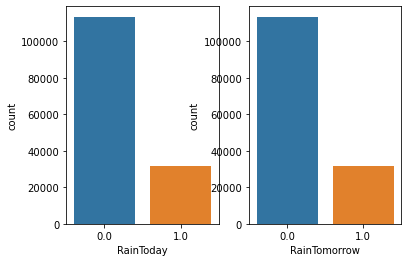

<Figure size 1440x1440 with 0 Axes>

In [160]:
fig, ax =plt.subplots(1,2)
print(rain.RainToday.value_counts())
print(rain.RainTomorrow.value_counts())

plt.figure(figsize=(20,20))
sns.countplot(data=rain,x='RainToday',ax=ax[0])
sns.countplot(data=rain,x='RainTomorrow',ax=ax[1])

### 2.2 Direction of wind at 9 am, 3 pm.

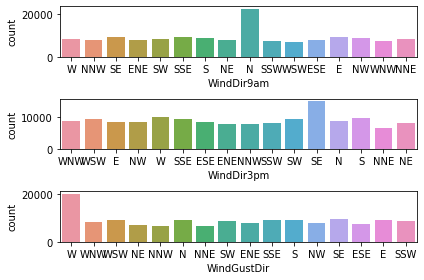

<Figure size 720x720 with 0 Axes>

In [161]:
fig, ax =plt.subplots(3,1)
plt.figure(figsize=(10,10))

sns.countplot(data=rain,x='WindDir9am',ax=ax[0])
sns.countplot(data=rain,x='WindDir3pm',ax=ax[1])
sns.countplot(data=rain,x='WindGustDir',ax=ax[2])
fig.tight_layout()

#### At 9 am, it is highest for direction N.
#### At 3 pm, it is highest for direction SE.

#### Visualizing locations by counts from highest to lowest by Treemap plot

In [162]:
pip install plotly==5.10.0

Note: you may need to restart the kernel to use updated packages.


In [163]:
import plotly.express as px

In [164]:
print("Unique locations and their counts :")
location = rain["Location"].value_counts()
location = location.reset_index()
location.columns= ["Location", "Counts"]
print(location)

Unique locations and their counts :
            Location  Counts
0           Canberra    3436
1             Sydney    3344
2             Darwin    3193
3          Melbourne    3193
4           Brisbane    3193
5           Adelaide    3193
6              Perth    3193
7             Hobart    3193
8             Albany    3040
9       MountGambier    3040
10          Ballarat    3040
11        Townsville    3040
12         GoldCoast    3040
13            Cairns    3040
14        Launceston    3040
15      AliceSprings    3040
16           Bendigo    3040
17            Albury    3040
18       MountGinini    3040
19        Wollongong    3040
20         Newcastle    3039
21       Tuggeranong    3039
22           Penrith    3039
23           Woomera    3009
24         Nuriootpa    3009
25             Cobar    3009
26      CoffsHarbour    3009
27             Moree    3009
28              Sale    3009
29      PerthAirport    3009
30        PearceRAAF    3009
31       Witchcliffe    3009
32     

In [165]:
fig = px.treemap(location, path=['Location'], values='Counts', color='Counts', title="Arrangement Of Locations By Counts From Highest To Lowest")
fig.show()

#### Visualizing Rainfall column by Histogram

In [166]:
fig = px.histogram(rain, x="Rainfall", title="Rainfall in mm", color_discrete_sequence=["red"], nbins=25)
fig.show()

#### Visualizing Evaporation column by Histogram

In [167]:
fig = px.histogram(rain, x="Evaporation", title="Evaporation in mm", color_discrete_sequence=["blue"])
fig.show()

#### Visualizing WindGustDir column by Bar plot

In [168]:
print("Unique wind gust directions and their counts :")
windgustdir = rain["WindGustDir"].value_counts()
windgustdir = windgustdir.reset_index()
windgustdir.columns= ["Wind Gust Direction", "Counts"]
print(windgustdir)

Unique wind gust directions and their counts :
   Wind Gust Direction  Counts
0                    W   20241
1                   SE    9418
2                    N    9313
3                  SSE    9216
4                    E    9181
5                    S    9168
6                  WSW    9069
7                   SW    8967
8                  SSW    8736
9                  WNW    8252
10                  NW    8122
11                 ENE    8104
12                 ESE    7372
13                  NE    7133
14                 NNW    6620
15                 NNE    6548


In [169]:
fig = px.bar(windgustdir, x="Wind Gust Direction", y="Counts", title="Arrangement Of Wind Gust Directions By Counts From Highest To Lowest", color="Counts")
fig.show()

#### Listing out unique values from WindGustSpeed column

In [170]:
print("Unique wind gust speed in km/hr and their counts :")
windgustspd = rain["WindGustSpeed"].value_counts()
windgustspd = windgustspd.reset_index()
windgustspd.columns= ["Wind Gust Speed", "Counts"]
print(windgustspd)

Unique wind gust speed in km/hr and their counts :
    Wind Gust Speed  Counts
0          40.03523   10263
1          35.00000    9215
2          39.00000    8794
3          31.00000    8428
4          37.00000    8047
..              ...     ...
63        122.00000       3
64        126.00000       2
65        124.00000       2
66        130.00000       1
67          6.00000       1

[68 rows x 2 columns]


In [171]:
fig = px.bar(windgustspd, x="Wind Gust Speed", y="Counts", title="Arrangement Of Wind Gust Speeds (Km/Hr) By Counts From Highest To Lowest", color="Counts")
fig.show()

#### Calculating average min & max temperature for different locations

In [172]:
loctemp = rain.groupby("Location")[["MinTemp", "MaxTemp"]].mean().round()
loctemp = loctemp.reset_index()
loctemp.columns= ["Location","MinTemp", "MaxTemp"]
print(loctemp)

            Location  MinTemp  MaxTemp
0           Adelaide     13.0     23.0
1             Albany     13.0     20.0
2             Albury     10.0     23.0
3       AliceSprings     13.0     29.0
4      BadgerysCreek     11.0     24.0
5           Ballarat      7.0     18.0
6            Bendigo      9.0     22.0
7           Brisbane     16.0     26.0
8             Cairns     21.0     30.0
9           Canberra      7.0     21.0
10             Cobar     13.0     26.0
11      CoffsHarbour     14.0     24.0
12          Dartmoor      9.0     20.0
13            Darwin     23.0     33.0
14         GoldCoast     17.0     26.0
15            Hobart      9.0     18.0
16         Katherine     20.0     35.0
17        Launceston      8.0     19.0
18         Melbourne     12.0     21.0
19  MelbourneAirport     10.0     20.0
20           Mildura     11.0     25.0
21             Moree     13.0     27.0
22      MountGambier      9.0     20.0
23       MountGinini      4.0     12.0
24         Newcastle     

#### Visualizing locations with average MinTemp and MaxTemp using Bar plot

In [173]:
fig = px.bar(loctemp, x="Location", y=["MinTemp", "MaxTemp"], title="Locations With Average Minimum Temperature And Maximum Temperature")
fig.show()

#### Visualizing RainToday column in different locations by Histogram plot

In [174]:
fig = px.histogram(rain, x='Location', title='RainToday In Different Locations', color='RainToday')
fig.show()

#### Visualizing RainTomorrow column in different locations by Histogram plot

In [175]:
fig = px.histogram(rain, x='Location', title='RainTomorrow In Different Locations', color='RainTomorrow')
fig.show()

In [176]:
from IPython.core.display import display, HTML
display(HTML("<div class='tableauPlaceholder' id='viz1652712003286' style='position: relative'><noscript><a href='#'><img alt='RainFall Per Location ' src='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;Ra&#47;RainFallinLocations&#47;Sheet1&#47;1_rss.png' style='border: none' /></a></noscript><object class='tableauViz'  style='display:none;'><param name='host_url' value='https%3A%2F%2Fpublic.tableau.com%2F' /> <param name='embed_code_version' value='3' /> <param name='site_root' value='' /><param name='name' value='RainFallinLocations&#47;Sheet1' /><param name='tabs' value='no' /><param name='toolbar' value='yes' /><param name='static_image' value='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;Ra&#47;RainFallinLocations&#47;Sheet1&#47;1.png' /> <param name='animate_transition' value='yes' /><param name='display_static_image' value='yes' /><param name='display_spinner' value='yes' /><param name='display_overlay' value='yes' /><param name='display_count' value='yes' /><param name='language' value='en-US' /><param name='filter' value='publish=yes' /></object></div>                <script type='text/javascript'>                    var divElement = document.getElementById('viz1652712003286');                    var vizElement = divElement.getElementsByTagName('object')[0];                    vizElement.style.width='100%';vizElement.style.height=(divElement.offsetWidth*0.75)+'px';                    var scriptElement = document.createElement('script');                    scriptElement.src = 'https://public.tableau.com/javascripts/api/viz_v1.js';                    vizElement.parentNode.insertBefore(scriptElement, vizElement);                </script>"))

### Here, We took an overview on the average amount of rainfall for each city in Australia and the frequency of each rainfall.

In [177]:
# parse the dates, currently coded as strings, into datetime format

rain['Date'] = pd.to_datetime(rain['Date'])

In [178]:
# extract year from date

rain['Year'] = rain['Date'].dt.year

rain['Year'].head()

0    2008
1    2008
2    2008
3    2008
4    2008
Name: Year, dtype: int64

In [179]:
# extract month from date

rain['Month'] = rain['Date'].dt.month

rain['Month'].head()

0    12
1    12
2    12
3    12
4    12
Name: Month, dtype: int64

In [180]:
# extract day from date

rain['Day'] = rain['Date'].dt.day

rain['Day'].head()

0    1
1    2
2    3
3    4
4    5
Name: Day, dtype: int64

In [181]:
rain.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,2008-12-01,Albury,13.4,22.9,0.6,5.468232,7.611178,W,44.0,W,...,1007.1,8.000000,4.50993,16.9,21.8,0.0,0.0,2008,12,1
1,2008-12-02,Albury,7.4,25.1,0.0,5.468232,7.611178,WNW,44.0,NNW,...,1007.8,4.447461,4.50993,17.2,24.3,0.0,0.0,2008,12,2
2,2008-12-03,Albury,12.9,25.7,0.0,5.468232,7.611178,WSW,46.0,W,...,1008.7,4.447461,2.00000,21.0,23.2,0.0,0.0,2008,12,3
3,2008-12-04,Albury,9.2,28.0,0.0,5.468232,7.611178,NE,24.0,SE,...,1012.8,4.447461,4.50993,18.1,26.5,0.0,0.0,2008,12,4
4,2008-12-05,Albury,17.5,32.3,1.0,5.468232,7.611178,W,41.0,ENE,...,1006.0,7.000000,8.00000,17.8,29.7,0.0,0.0,2008,12,5


### Date Plot
##### We are going to plot features with datetime. Here, I am going to use date from last 3 years.

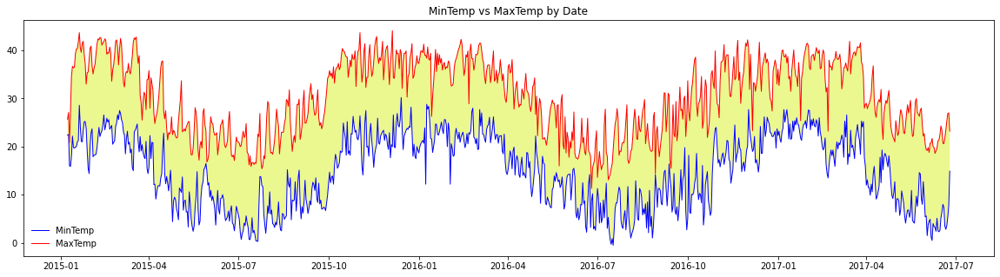

In [182]:
df_dateplot = rain.iloc[-900:,:]
plt.figure(figsize=[20,5])
plt.plot(df_dateplot['Date'],df_dateplot['MinTemp'],color='blue',linewidth=1, label= 'MinTemp')
plt.plot(df_dateplot['Date'],df_dateplot['MaxTemp'],color='red',linewidth=1, label= 'MaxTemp')
plt.fill_between(df_dateplot['Date'],df_dateplot['MinTemp'],df_dateplot['MaxTemp'], facecolor = '#EBF78F')
plt.title('MinTemp vs MaxTemp by Date')
plt.legend(loc='lower left', frameon=False)
plt.show()

Above plot shows that the MinTemp and MaxTemp relatively increases and decreases every year.\
The weather conditions are always opposite in the two hemispheres. As, the Australia is situated in the southern hemisphere. The seasons are bit different.\
As you can see that, December to February is summer; March to May is autumn; June to August is winter; and September to November is spring.

In [183]:
# again view the summary of dataset

rain.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 26 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   Date           145460 non-null  datetime64[ns]
 1   Location       145460 non-null  object        
 2   MinTemp        145460 non-null  float64       
 3   MaxTemp        145460 non-null  float64       
 4   Rainfall       145460 non-null  float64       
 5   Evaporation    145460 non-null  float64       
 6   Sunshine       145460 non-null  float64       
 7   WindGustDir    145460 non-null  object        
 8   WindGustSpeed  145460 non-null  float64       
 9   WindDir9am     145460 non-null  object        
 10  WindDir3pm     145460 non-null  object        
 11  WindSpeed9am   145460 non-null  float64       
 12  WindSpeed3pm   145460 non-null  float64       
 13  Humidity9am    145460 non-null  float64       
 14  Humidity3pm    145460 non-null  float64       
 15  

In [184]:
# drop the original Date variable

rain.drop('Date', axis=1, inplace = True)

In [185]:
# preview the dataset again

rain.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,Albury,13.4,22.9,0.6,5.468232,7.611178,W,44.0,W,WNW,...,1007.1,8.000000,4.50993,16.9,21.8,0.0,0.0,2008,12,1
1,Albury,7.4,25.1,0.0,5.468232,7.611178,WNW,44.0,NNW,WSW,...,1007.8,4.447461,4.50993,17.2,24.3,0.0,0.0,2008,12,2
2,Albury,12.9,25.7,0.0,5.468232,7.611178,WSW,46.0,W,WSW,...,1008.7,4.447461,2.00000,21.0,23.2,0.0,0.0,2008,12,3
3,Albury,9.2,28.0,0.0,5.468232,7.611178,NE,24.0,SE,E,...,1012.8,4.447461,4.50993,18.1,26.5,0.0,0.0,2008,12,4
4,Albury,17.5,32.3,1.0,5.468232,7.611178,W,41.0,ENE,NW,...,1006.0,7.000000,8.00000,17.8,29.7,0.0,0.0,2008,12,5


#### Encoding the categorical variables

In [186]:
le = preprocessing.LabelEncoder()
rain['Location'] = le.fit_transform(rain['Location'])
rain['WindDir9am'] = le.fit_transform(rain['WindDir9am'])
rain['WindDir3pm'] = le.fit_transform(rain['WindDir3pm'])
rain['WindGustDir'] = le.fit_transform(rain['WindGustDir'])

In [187]:
rain.head(5)

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,2,13.4,22.9,0.6,5.468232,7.611178,13,44.0,13,14,...,1007.1,8.000000,4.50993,16.9,21.8,0.0,0.0,2008,12,1
1,2,7.4,25.1,0.0,5.468232,7.611178,14,44.0,6,15,...,1007.8,4.447461,4.50993,17.2,24.3,0.0,0.0,2008,12,2
2,2,12.9,25.7,0.0,5.468232,7.611178,15,46.0,13,15,...,1008.7,4.447461,2.00000,21.0,23.2,0.0,0.0,2008,12,3
3,2,9.2,28.0,0.0,5.468232,7.611178,4,24.0,9,0,...,1012.8,4.447461,4.50993,18.1,26.5,0.0,0.0,2008,12,4
4,2,17.5,32.3,1.0,5.468232,7.611178,13,41.0,1,7,...,1006.0,7.000000,8.00000,17.8,29.7,0.0,0.0,2008,12,5


#### MinTemp and Temp9am highly correlated.
#### MinTemp and Temp3pm highly correlated.
#### MaxTemp and Temp9am highly correlated.
#### MaxTemp and Temp3pm highly correlated.

#### Temp3pm and Temp9am highly correlated.

#### Humidity9am and Humidity3pm highly correlated.

## 2.3 Boxplots

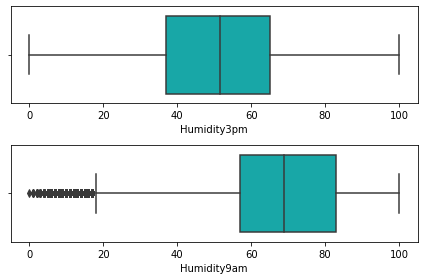

<Figure size 720x720 with 0 Axes>

In [188]:
fig, ax =plt.subplots(2,1)
plt.figure(figsize=(10,10))
sns.boxplot(rain['Humidity3pm'],orient='v',color='c',ax=ax[0])
sns.boxplot(rain['Humidity9am'],orient='v',color='c',ax=ax[1])
fig.tight_layout()

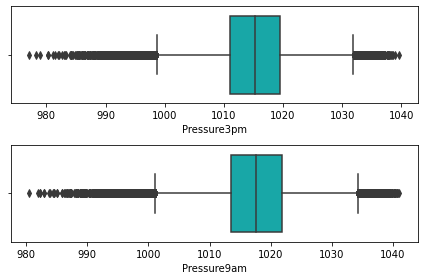

<Figure size 720x720 with 0 Axes>

In [189]:
fig, ax =plt.subplots(2,1)
plt.figure(figsize=(10,10))
sns.boxplot(rain['Pressure3pm'],orient='v',color='c',ax=ax[0])
sns.boxplot(rain['Pressure9am'],orient='v',color='c',ax=ax[1])
fig.tight_layout()

## 2.4 Bivariate Analysis

<AxesSubplot:xlabel='RainToday', ylabel='MaxTemp'>

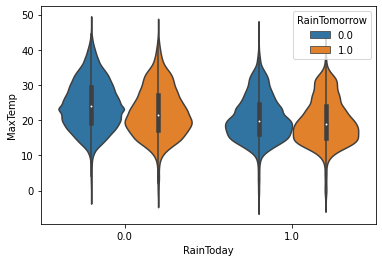

In [190]:
sns.violinplot(x='RainToday',y='MaxTemp',data=rain,hue='RainTomorrow')

<AxesSubplot:xlabel='RainToday', ylabel='MinTemp'>

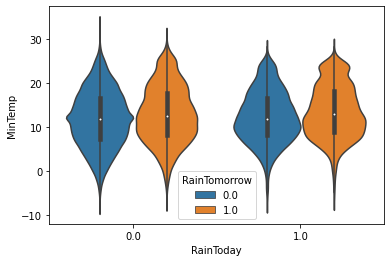

In [191]:
sns.violinplot(x='RainToday',y='MinTemp',data=rain,hue='RainTomorrow')

### 2.5 Removing the outliers

In [192]:
print('Shape of DataFrame Before Removing Outliers', rain.shape )
rain=rain[(np.abs(stats.zscore(rain)) < 3).all(axis=1)]
print('Shape of DataFrame After Removing Outliers', rain.shape )

Shape of DataFrame Before Removing Outliers (145460, 25)
Shape of DataFrame After Removing Outliers (136608, 25)


In [193]:
rain=rain.drop(['Temp3pm','Temp9am','Humidity9am'],axis=1)
rain.columns

Index(['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity3pm', 'Pressure9am',
       'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'RainToday', 'RainTomorrow',
       'Year', 'Month', 'Day'],
      dtype='object')

### 2.6 Train test split

In [194]:
X = rain.drop(["RainTomorrow"], axis=1)
y = rain["RainTomorrow"]

# Splitting test and training sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

X.shape

(136608, 21)

In [195]:
X_test

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,WindSpeed3pm,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,RainToday,Year,Month,Day
1988,2,1.7,14.2,0.0,5.468232,7.611178,6,17.00000,1,10,...,4.0,64.000000,1031.6,1027.5,8.000000,8.00000,0.0,2014,8,9
22925,27,19.6,24.0,0.0,7.400000,6.600000,2,54.00000,0,2,...,26.0,67.000000,1019.3,1017.4,7.000000,7.00000,0.0,2014,3,11
120713,31,13.6,19.6,0.0,5.200000,4.700000,15,54.00000,13,12,...,26.0,57.000000,1015.5,1016.0,7.000000,6.00000,0.0,2008,9,14
82491,12,-0.1,18.0,0.6,2.800000,9.700000,5,26.00000,3,5,...,15.0,41.000000,1029.4,1024.1,4.447461,4.50993,0.0,2013,5,2
11409,11,12.1,24.4,3.1,5.468232,7.611178,5,50.00000,3,4,...,35.0,74.000000,1022.0,1016.5,8.000000,4.50993,1.0,2015,9,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72701,20,8.1,14.0,0.4,2.200000,8.100000,15,54.00000,13,12,...,22.0,48.000000,1021.5,1022.8,6.000000,6.00000,0.0,2015,7,26
1493,2,8.4,22.9,0.0,5.468232,7.611178,14,30.00000,2,13,...,19.0,42.000000,1019.3,1016.9,4.447461,1.00000,0.0,2013,4,1
128841,43,12.3,19.7,0.0,5.468232,7.611178,14,43.00000,14,13,...,19.0,74.000000,1016.1,1015.0,4.447461,4.50993,0.0,2014,10,3
83345,12,7.7,13.7,5.2,0.800000,0.600000,8,35.00000,8,8,...,20.0,51.539116,1016.8,1020.7,4.447461,4.50993,1.0,2015,9,3


### 2.7 Balancing the data using SMOTE

In [196]:
os = SMOTE()
X_train, y_train = os.fit_resample(X_train, y_train)
count = Counter(y_train)
print(count)

Counter({0.0: 86830, 1.0: 86830})


## 3. Training The Models

In [197]:
model = LogisticRegression(max_iter=500)
model.fit(X_train, y_train)
predicted=model.predict(X_test)

conf = confusion_matrix(y_test, predicted)
print ("The accuracy of Logistic Regression is : ", accuracy_score(y_test, predicted)*100, "%")
print()
print("F1 score for logistic regression is :",f1_score(y_test, predicted,)*100, "%")

The accuracy of Logistic Regression is :  77.7981114120489 %

F1 score for logistic regression is : 58.71784401796651 %


In [198]:
xgbc = XGBClassifier(objective='binary:logistic')
xgbc.fit(X_train,y_train)
predicted = xgbc.predict(X_test)
print ("The accuracy of Logistic Regression is : ", accuracy_score(y_test, predicted)*100, "%")
print()
print("F1 score for XGBoost is :",f1_score(y_test, predicted,)*100, "%")

The accuracy of Logistic Regression is :  85.9929726959959 %

F1 score for XGBoost is : 61.55700652938223 %


In [199]:
model = GaussianNB()
model.fit(X_train, y_train)
  
predicted = model.predict(X_test)
  
print("The accuracy of Gaussian Naive Bayes model is : ", accuracy_score(y_test, predicted)*100, "%")
print()
print("F1 score for Gaussian Naive Bayes is :",f1_score(y_test, predicted,)*100, "%")

The accuracy of Gaussian Naive Bayes model is :  76.93433862821169 %

F1 score for Gaussian Naive Bayes is : 55.83742116327961 %


In [200]:
model = BernoulliNB()
model.fit(X_train, y_train)
  
predicted = model.predict(X_test)
  
print("The accuracy of Bernoulli Naive Bayes model is : ", accuracy_score(y_test, predicted)*100, "%")
print()
print("F1 score for Bernoulli Naive Bayes is :",f1_score(y_test, predicted,)*100, "%")

The accuracy of Bernoulli Naive Bayes model is :  70.61342507869117 %

F1 score for Bernoulli Naive Bayes is : 45.87799123693967 %


In [201]:
model = RandomForestRegressor(n_estimators = 100, random_state = 0)  
model.fit(X_train, y_train)  
predicted = model.predict(X_test)
print("The accuracy of Random Forest is : ", accuracy_score(y_test, predicted.round())*100, "%")

The accuracy of Random Forest is :  85.08527926213308 %


In [202]:
model = LGBMClassifier(n_estimators=500,max_depth=6)
model.fit(X_train, y_train)  
predicted = model.predict(X_test)
print("The accuracy of LGBM is : ", accuracy_score(y_test, predicted.round())*100, "%")

The accuracy of LGBM is :  86.40289876290169 %


In [203]:
# Predicting the test set results
y_pred = model.predict(X_test)
y_pred = (y_pred > 0.5)

<AxesSubplot:>

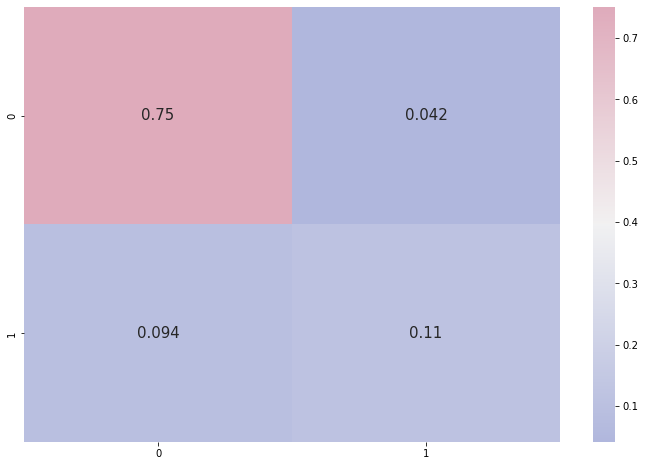

In [204]:
# confusion matrix
cmap1 = sns.diverging_palette(260,-10,s=50, l=75, n=5, as_cmap=True)
plt.subplots(figsize=(12,8))
cf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(cf_matrix/np.sum(cf_matrix), cmap = cmap1, annot = True, annot_kws = {'size':15})

In [205]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.89      0.95      0.92     21647
         1.0       0.73      0.55      0.63      5675

    accuracy                           0.86     27322
   macro avg       0.81      0.75      0.77     27322
weighted avg       0.86      0.86      0.86     27322



In [206]:
cm = confusion_matrix(y_test, y_pred)

print('Confusion matrix\n\n', cm)

print('\nTrue Positives(TP) = ', cm[0,0])

print('\nTrue Negatives(TN) = ', cm[1,1])

print('\nFalse Positives(FP) = ', cm[0,1])

print('\nFalse Negatives(FN) = ', cm[1,0])

Confusion matrix

 [[20507  1140]
 [ 2575  3100]]

True Positives(TP) =  20507

True Negatives(TN) =  3100

False Positives(FP) =  1140

False Negatives(FN) =  2575


In [207]:
cm_matrix = pd.DataFrame(data = cm, columns = ['Actual Positive:1', 'Actual Negative:0'], 
                                 index=['Predict Positive:1', 'Predict Negative:0'])
cm_matrix.head()

,Actual Positive:1,Actual Negative:0
Predict Positive:1,20507,1140
Predict Negative:0,2575,3100


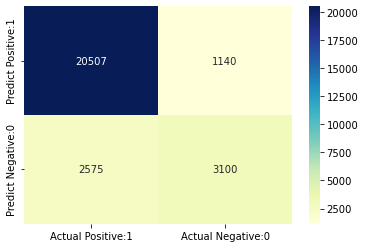

In [208]:
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu');

In [209]:
# Applying 5-Fold Cross Validation

from sklearn.model_selection import cross_val_score

scores = cross_val_score(model, X_train, y_train, cv = 5, scoring='accuracy')

print('Cross-validation scores:{}'.format(scores))

Cross-validation scores:[0.64084994 0.90202119 0.9634343  0.96372222 0.96254175]


In [210]:
# compute Average cross-validation score

print('Average cross-validation score: {:.4f}'.format(scores.mean()))

Average cross-validation score: 0.8865


In [222]:
from sklearn.model_selection import GridSearchCV


parameters = {"learning_rate": [0.01, 0.1],
              "n_estimators": [300, 500],
               "colsample_bytree": [0.7, 1]}


grid_search = GridSearchCV(estimator = model,  
                           param_grid = parameters,
                           scoring = 'accuracy',
                           cv = 5,
                           verbose=0)


grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=LGBMClassifier(max_depth=6, n_estimators=500),
             param_grid={'colsample_bytree': [0.7, 1],
                         'learning_rate': [0.01, 0.1],
                         'n_estimators': [300, 500]},
             scoring='accuracy')

In [216]:
# examine the best model

# best score achieved during the GridSearchCV
print('GridSearch CV best score : {:.4f}\n\n'.format(grid_search.best_score_))

GridSearch CV best score : 0.8497




In [217]:
# print parameters that give the best results

print('Parameters that give the best results :','\n\n', (grid_search.best_params_))

Parameters that give the best results : 

 {'colsample_bytree': 0.7, 'learning_rate': 0.01, 'n_estimators': 500}


In [219]:
# calculate GridSearch CV score on test set

print('GridSearch CV score on test set: {0:0.4f}'.format(grid_search.score(X_test, y_test)))

GridSearch CV score on test set: 0.8388
